In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

from pycaret.classification import ClassificationExperiment
from pycaret.datasets import get_data

from sklearn.metrics import f1_score

In [2]:
data = get_data('data/diabetes')
data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


#### Dataset exploration

In [3]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Auto-ML using pycaret

In [4]:
exp = ClassificationExperiment()
exp.setup(
    data,
    target='Outcome',
    session_id=42
)

In [5]:
best = exp.compare_models()

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,20:45:22
Status,. . . . . . . . . . . . . . . . . .,Loading Estimator
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


In [6]:
exp.evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

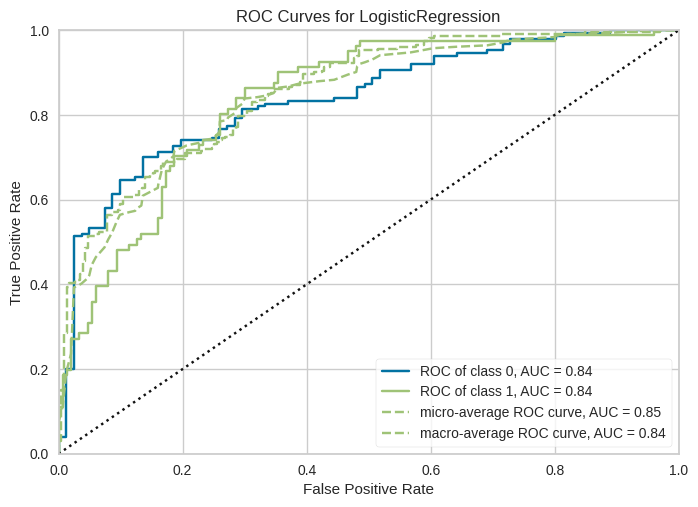

In [7]:
exp.plot_model(best, plot='auc')

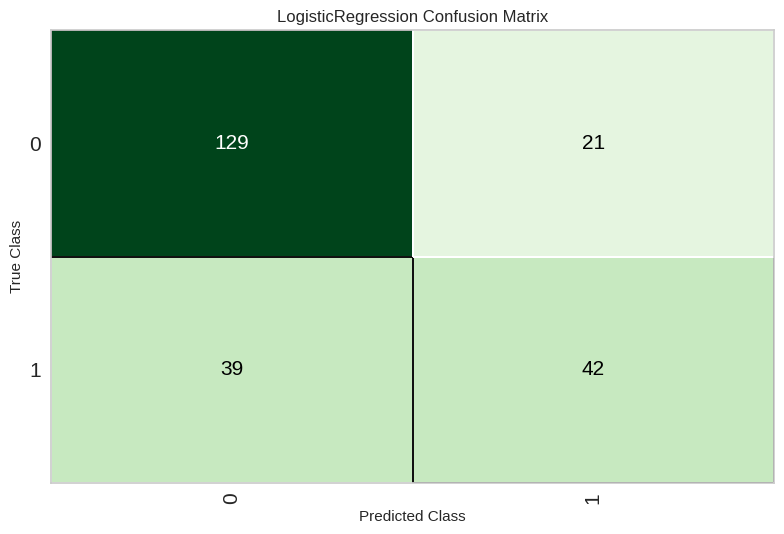

In [8]:
exp.plot_model(best, plot='confusion_matrix')

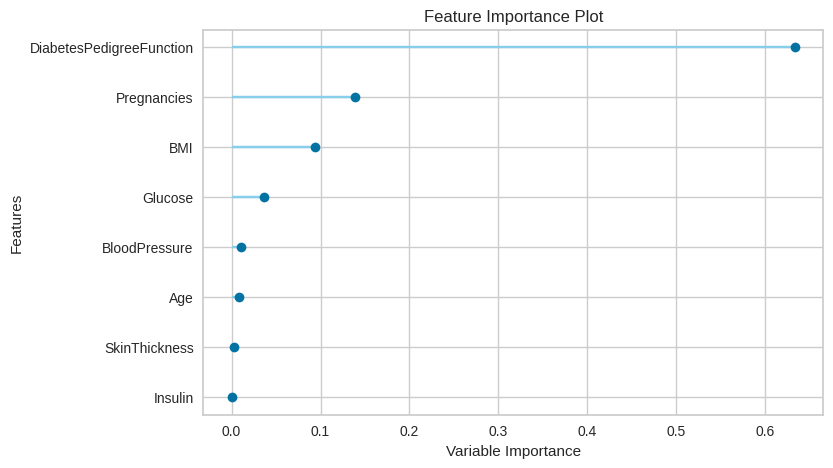

In [9]:
exp.plot_model(best, plot = 'feature')

#### Result interpretation using explain.model.ModelExplainer

- pycaret interpret isn't really model-agnostic

In [10]:
try:
    exp.interpret_model(best, plot = 'summary')
except TypeError as e:
    print(e)

This function only supports tree based models for binary classification: catboost, dt, xgboost, rf, lightgbm, et.


In [11]:
from explain.model import ModelExplainer

mexp = ModelExplainer(best, data.drop(columns=['Outcome']))

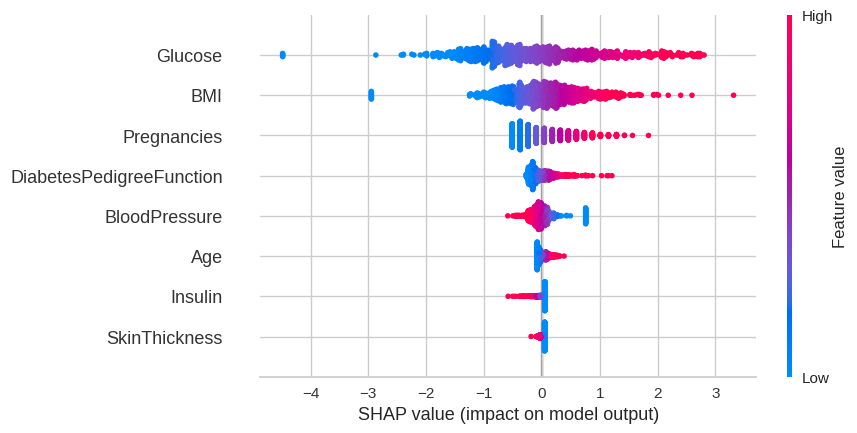

In [12]:
mexp.plot_shap()

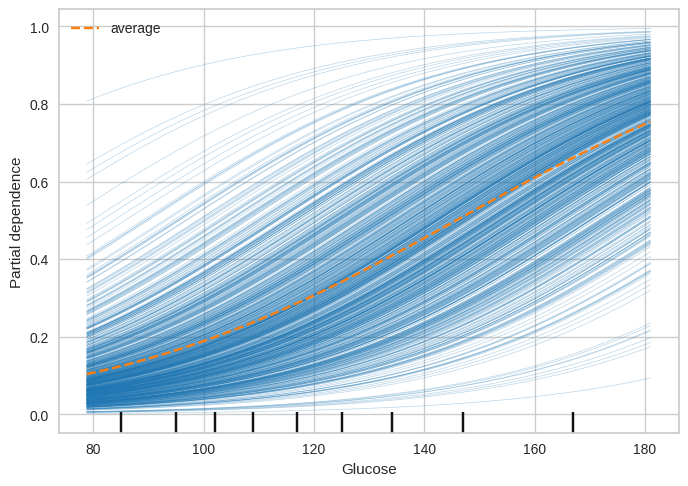

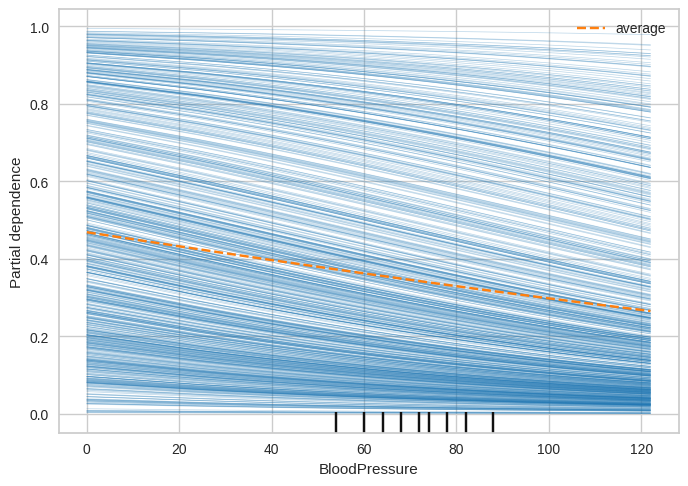

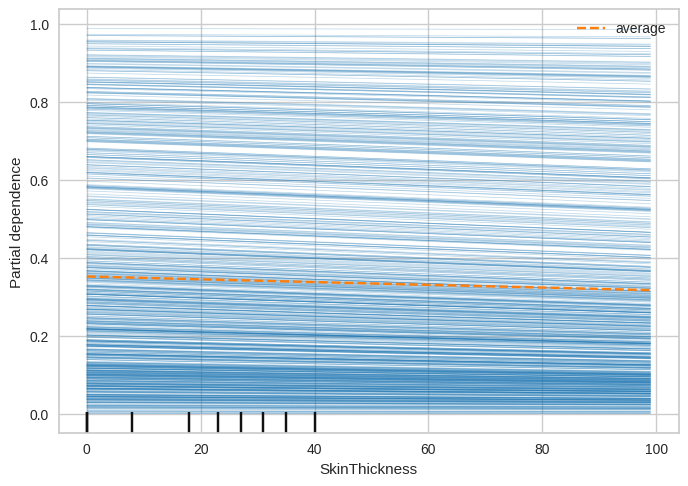

In [13]:
mexp.plot_ice([1, 2, 3])

In [14]:
observation = data.drop(columns='Outcome').sample(1, random_state=40)
mexp.plot_lime(observation)

In [15]:
mexp.plot_anchors(observation)

Prediction: [1]
Anchor: Glucose > 140.25 AND BMI > 36.60
Precision:  0.99
Coverage:  0.09


#### Virtual datasets: plot model score distributions against dataset size used for training

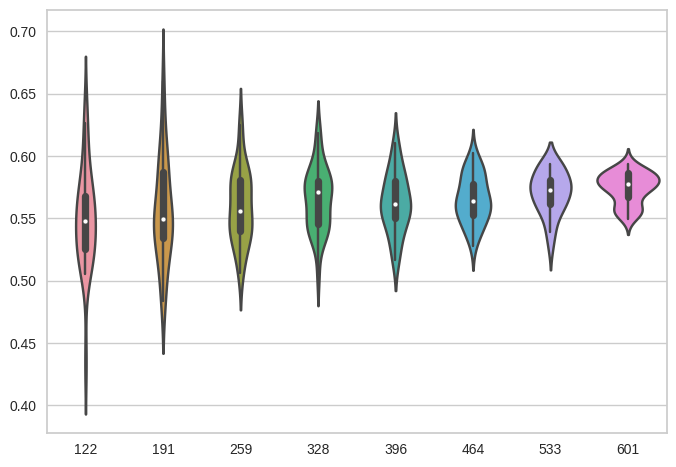

In [16]:
from explain.dataset import VirtualDataset

vds = VirtualDataset(best, f1_score, n_iter=8)
vds.display(data.drop(columns=['Outcome']), data['Outcome'], density=30)